In [1]:
#Setting up the code and installing required packages 
%load_ext autotime
from util import *
from glob import glob
import matplotlib.pyplot as plt
from shapely import wkt
from shapely.geometry import LineString, Polygon
import geopandas as gpd
from shapely.geometry import Point, LineString
import numpy as np
from shapelysmooth import taubin_smooth
import shutil
pd.set_option("display.max_columns", None)

In [60]:
for f in tqdm(glob("Projections_best/*polygon.shp")):
    polygon = gpd.read_file(f)
    polygon.geometry.apply(lambda line: taubin_smooth(line, steps=500)).to_file(f.replace("polygon", "polygon_smoothed"))

  0%|          | 0/6 [00:00<?, ?it/s]

In [39]:
#Input intersects shapefile 

site="RakiuraStewartIsland"
gdf = gpd.read_file(f"Data\Merged Intersects_UniqueID_Proxy\RakiuraStewartIsland_Intersects_Proxy.shp")

In [40]:
#Setting the year data will be projected to. Currently 2100
gdf["Date"] = pd.to_datetime(gdf.ShorelineI, dayfirst=True, format='mixed')
gdf["Year"] = gdf.Date.dt.year
gdf["YearsSinceBase"] = (gdf.Date - pd.Timestamp(1800, 1, 1)).dt.days / 365.25
gdf["YearsUntilFuture"] = (
    pd.Timestamp(2100, 1, 1) - gdf.Date
    ).dt.days / 365.25
gdf.Date = gdf.Date.astype(str)
gdf["TransectID"] = gdf.Unique_ID.astype(np.int64)
gdf

,Join_Count,TARGET_FID,ShorelineI,BaselineID,Distance,IntersectX,IntersectY,Uncertaint,Unique_ID,Date,Region,Site,Digitiser,Scale,Notes,Source,CPS,Proxy,Photoscale,Georef_ER,Pixel_Er,Total_UNCY,USDate,SHLength,Date_1,ID,geometry,Year,YearsSinceBase,YearsUntilFuture,TransectID
0,1,0,02/10/1958,0.0,-87.22,1.197815e+06,4.775669e+06,5.38,2.030544e+11,1958-10-02,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,44500,5.00,1.643953,5.379998,02/10/1958,0.522014,1958/02/10,12772.0,POINT Z (1197814.973 4775669.042 0),1958,158.746064,141.248460,203054437032
1,1,1,02/25/1978,0.0,-82.80,1.197813e+06,4.775673e+06,3.78,2.030544e+11,1978-02-25,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,14900,4.00,0.592437,3.784704,02/25/1978,0.595030,1978/02/25,12775.0,POINT Z (1197813.318 4775673.144 0),1978,178.146475,121.848049,203054437032
2,1,2,02/05/2007,0.0,-59.09,1.197804e+06,4.775695e+06,2.20,2.030544e+11,2007-05-02,Southland,DoughboyBay,MD,1000,EdgeVeg,LDS,4,1,0,0.00,0.750000,2.201681,02/05/2007,0.597889,2007/02/05,12767.0,POINT Z (1197804.453 4775695.13 0),2007,207.326489,92.668036,203054437032
3,1,3,02/10/1958,0.0,-88.83,1.197825e+06,4.775671e+06,5.38,2.030544e+11,1958-10-02,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,44500,5.00,1.643953,5.379998,02/10/1958,0.522014,1958/02/10,12772.0,POINT Z (1197824.85 4775671.287 0),1958,158.746064,141.248460,203054438164
4,1,4,02/25/1978,0.0,-84.02,1.197823e+06,4.775676e+06,3.78,2.030544e+11,1978-02-25,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,14900,4.00,0.592437,3.784704,02/25/1978,0.595030,1978/02/25,12775.0,POINT Z (1197823.049 4775675.754 0),1978,178.146475,121.848049,203054438164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6896,1,6896,02/14/2020,6.0,-38.68,1.201482e+06,4.793256e+06,2.10,2.030574e+11,2020-02-14,Southland,MasonsBay,MT,1000,None,VHR,1,3,0,2.02,0.390454,2.101845,02/14/2020,0.797329,2020/02/14,13005.0,POINT Z (1201482.411 4793256.346 0),2020,220.114990,79.879535,203057355976
6897,1,6897,12/10/1958,6.0,-36.92,1.201481e+06,4.793256e+06,10.08,2.030574e+11,1958-10-12,Southland,MasonsBay,MT,2000,None,RL,5,1,44500,5.03,1.608050,10.083394,12/10/1958,3.005170,1958/12/10,12941.0,POINT Z (1201480.664 4793256.153 0),1958,158.773443,141.221081,203057355976
6898,1,6898,02/25/1978,6.0,-27.44,1.201470e+06,4.793265e+06,4.21,2.030574e+11,1978-02-25,Southland,MasonsBay,MT,1000,None,RL,4,1,14900,3.61,0.604604,4.205062,02/25/1978,0.524352,1978/02/25,12960.0,POINT Z (1201470.141 4793265.053 0),1978,178.146475,121.848049,203057356977
6899,1,6899,02/14/2020,6.0,-39.16,1.201482e+06,4.793266e+06,2.10,2.030574e+11,2020-02-14,Southland,MasonsBay,MT,1000,None,VHR,1,3,0,2.02,0.390454,2.101845,02/14/2020,0.797329,2020/02/14,13005.0,POINT Z (1201481.786 4793266.338 0),2020,220.114990,79.879535,203057356977


In [41]:
gdf.groupby("TransectID").size().value_counts()

5    1118
3     229
4     156
Name: count, dtype: int64

<Axes: >

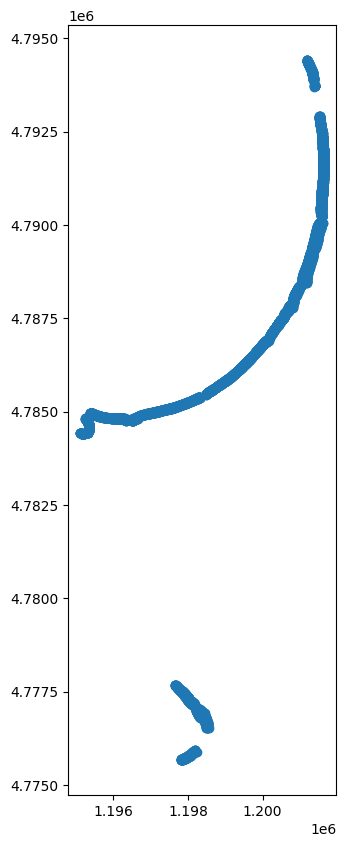

In [42]:
good = gdf.groupby("TransectID").Proxy.nunique() == 1
good_transects = good[good].index
gdf[gdf.TransectID.isin(good_transects)].plot(figsize=(10,10))

In [43]:
gdf.Proxy.value_counts()

Proxy
1    6806
3      93
0       2
Name: count, dtype: int64

In [44]:
proxies_at_transect = gdf.groupby("TransectID").Proxy.apply(lambda proxies: ",".join(str(i) for i in sorted(proxies.unique())))
proxies_at_transect.value_counts()

Proxy
1      1418
1,3      83
0,1       2
Name: count, dtype: int64

In [45]:
proxies_at_transect[proxies_at_transect == "1,3"]

TransectID
203057323970    1,3
203057324970    1,3
203057325971    1,3
203057326842    1,3
203057327844    1,3
               ... 
203057415472    1,3
203057416474    1,3
203057417477    1,3
203057418483    1,3
203057419491    1,3
Name: Proxy, Length: 83, dtype: object

In [46]:
def get_transects(intersects):
  p1 = intersects.geometry[intersects.Distance.idxmin()].coords[0]
  p2 = intersects.geometry[intersects.Distance.idxmax()].coords[0]
  azimuth = math.degrees(math.atan2(p1[0]-p2[0], p1[1]-p2[1]))
  if azimuth < 0:
      azimuth += 360
  return pd.Series({"Azimuth": azimuth, "geometry": LineString([p1, p2])})

lines = gdf.groupby("TransectID")[["geometry", "Distance"]].apply(get_transects)
lines.crs = gdf.crs
lines

,Azimuth,geometry
TransectID,,
203054437032,158.039438,"LINESTRING Z (1197814.973 4775669.042 0, 11978..."
203054438164,158.039436,"LINESTRING Z (1197824.85 4775671.287 0, 119781..."
203054439252,158.039436,"LINESTRING Z (1197834.638 4775673.751 0, 11978..."
203054440300,158.039436,"LINESTRING Z (1197844.143 4775676.919 0, 11978..."
203054441325,158.039438,"LINESTRING Z (1197853.924 4775679.404 0, 11978..."
...,...,...
203057472029,68.790774,"LINESTRING Z (1201217.64 4794384.631 0, 120120..."
203057473033,68.790774,"LINESTRING Z (1201212.688 4794393.436 0, 12011..."
203057474037,68.790773,"LINESTRING Z (1201207.735 4794402.241 0, 12011..."


In [47]:
#Set the extrapolation distance between intersects. Currently set to 20m
lines["dist_to_neighbour"] = lines.distance(lines.shift(-1))
breakpoints = lines.dist_to_neighbour[lines.dist_to_neighbour > 20]
lines["group"] = pd.Series(range(len(breakpoints)), index=breakpoints.index)
lines["group"] = lines.group.bfill().fillna(len(breakpoints)).astype(int)
transect_metadata = lines[["Azimuth", "group"]].to_dict(orient="index")
transect_metadata

{203054437032: {'Azimuth': 158.03943813516796, 'group': 0},
 203054438164: {'Azimuth': 158.03943566056768, 'group': 0},
 203054439252: {'Azimuth': 158.0394356602298, 'group': 0},
 203054440300: {'Azimuth': 158.03943566059365, 'group': 0},
 203054441325: {'Azimuth': 158.03943813539732, 'group': 0},
 203054442338: {'Azimuth': 158.03943566058982, 'group': 0},
 203054443343: {'Azimuth': 158.03943566020448, 'group': 0},
 203054444346: {'Azimuth': 158.03943566071723, 'group': 0},
 203054445346: {'Azimuth': 158.0394378860548, 'group': 0},
 203054446965: {'Azimuth': 151.50436079482338, 'group': 0},
 203054447966: {'Azimuth': 151.50436047756023, 'group': 0},
 203054448966: {'Azimuth': 151.5043631406423, 'group': 0},
 203054449966: {'Azimuth': 151.50436079522134, 'group': 0},
 203054450968: {'Azimuth': 151.50436079503402, 'group': 0},
 203054451970: {'Azimuth': 151.50436079580106, 'group': 0},
 203054452973: {'Azimuth': 151.50436314045822, 'group': 0},
 203054453976: {'Azimuth': 151.504360795863

In [48]:
linear_models = fit(gdf, transect_metadata)
linear_models

,TransectID,slope,intercept,group,r2_score,mae,mse,rmse
0,203054437032,0.597612,-184.780564,0,0.933275,2.987910,10.179226,3.190490
1,203054438164,0.628408,-191.357185,0,0.935932,3.074316,10.776474,3.282754
2,203054439252,0.646472,-195.000842,0,0.961956,2.403946,6.589148,2.566934
3,203054440300,0.646293,-195.198284,0,0.973917,1.977670,4.459511,2.111755
4,203054441325,0.661851,-198.717390,0,0.982892,1.632746,3.039603,1.743446
...,...,...,...,...,...,...,...,...
1498,203057472029,0.232514,-78.970734,15,0.768937,2.549772,8.506127,2.916526
1499,203057473033,0.213640,-74.644851,15,0.762832,2.282120,7.429935,2.725791
1500,203057474037,0.192542,-70.082153,15,0.752276,2.092911,6.391972,2.528235
1501,203057475043,0.167560,-64.831441,15,0.715088,2.061489,5.857144,2.420154


In [49]:
gdf

,Join_Count,TARGET_FID,ShorelineI,BaselineID,Distance,IntersectX,IntersectY,Uncertaint,Unique_ID,Date,Region,Site,Digitiser,Scale,Notes,Source,CPS,Proxy,Photoscale,Georef_ER,Pixel_Er,Total_UNCY,USDate,SHLength,Date_1,ID,geometry,Year,YearsSinceBase,YearsUntilFuture,TransectID
0,1,0,02/10/1958,0.0,-87.22,1.197815e+06,4.775669e+06,5.38,2.030544e+11,1958-10-02,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,44500,5.00,1.643953,5.379998,02/10/1958,0.522014,1958/02/10,12772.0,POINT Z (1197814.973 4775669.042 0),1958,158.746064,141.248460,203054437032
1,1,1,02/25/1978,0.0,-82.80,1.197813e+06,4.775673e+06,3.78,2.030544e+11,1978-02-25,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,14900,4.00,0.592437,3.784704,02/25/1978,0.595030,1978/02/25,12775.0,POINT Z (1197813.318 4775673.144 0),1978,178.146475,121.848049,203054437032
2,1,2,02/05/2007,0.0,-59.09,1.197804e+06,4.775695e+06,2.20,2.030544e+11,2007-05-02,Southland,DoughboyBay,MD,1000,EdgeVeg,LDS,4,1,0,0.00,0.750000,2.201681,02/05/2007,0.597889,2007/02/05,12767.0,POINT Z (1197804.453 4775695.13 0),2007,207.326489,92.668036,203054437032
3,1,3,02/10/1958,0.0,-88.83,1.197825e+06,4.775671e+06,5.38,2.030544e+11,1958-10-02,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,44500,5.00,1.643953,5.379998,02/10/1958,0.522014,1958/02/10,12772.0,POINT Z (1197824.85 4775671.287 0),1958,158.746064,141.248460,203054438164
4,1,4,02/25/1978,0.0,-84.02,1.197823e+06,4.775676e+06,3.78,2.030544e+11,1978-02-25,Southland,DoughboyBay,MD,1000,EdgeVeg,RL,3,1,14900,4.00,0.592437,3.784704,02/25/1978,0.595030,1978/02/25,12775.0,POINT Z (1197823.049 4775675.754 0),1978,178.146475,121.848049,203054438164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6896,1,6896,02/14/2020,6.0,-38.68,1.201482e+06,4.793256e+06,2.10,2.030574e+11,2020-02-14,Southland,MasonsBay,MT,1000,None,VHR,1,3,0,2.02,0.390454,2.101845,02/14/2020,0.797329,2020/02/14,13005.0,POINT Z (1201482.411 4793256.346 0),2020,220.114990,79.879535,203057355976
6897,1,6897,12/10/1958,6.0,-36.92,1.201481e+06,4.793256e+06,10.08,2.030574e+11,1958-10-12,Southland,MasonsBay,MT,2000,None,RL,5,1,44500,5.03,1.608050,10.083394,12/10/1958,3.005170,1958/12/10,12941.0,POINT Z (1201480.664 4793256.153 0),1958,158.773443,141.221081,203057355976
6898,1,6898,02/25/1978,6.0,-27.44,1.201470e+06,4.793265e+06,4.21,2.030574e+11,1978-02-25,Southland,MasonsBay,MT,1000,None,RL,4,1,14900,3.61,0.604604,4.205062,02/25/1978,0.524352,1978/02/25,12960.0,POINT Z (1201470.141 4793265.053 0),1978,178.146475,121.848049,203057356977
6899,1,6899,02/14/2020,6.0,-39.16,1.201482e+06,4.793266e+06,2.10,2.030574e+11,2020-02-14,Southland,MasonsBay,MT,1000,None,VHR,1,3,0,2.02,0.390454,2.101845,02/14/2020,0.797329,2020/02/14,13005.0,POINT Z (1201481.786 4793266.338 0),2020,220.114990,79.879535,203057356977


In [50]:
results = predict(gdf, linear_models, transect_metadata)
results.set_geometry("linear_model_point", inplace=True, crs=2193)
results

,TransectID,slope,intercept,group,r2_score,mae,mse,rmse,BaselineID,proxy,Year,ocean_point,linear_model_point,linear_model_predicted_distance,linear_model_distance,sqrt_model_point,sqrt_model_predicted_distance,sqrt_model_distance,BH_model_point,BH_model_predicted_distance,BH_model_distance,Sunamura_model_point,Sunamura_model_predicted_distance,Sunamura_model_distance
0,2.030544e+11,0.597612,-184.780564,0.0,0.933275,2.987910,10.179226,3.190490,0.0,1,2100,POINT (1197617.4689350585 4776158.850773319),POINT (1197815.699 4775667.239),-89.162682,30.072682,POINT (1197771.49992637 4775776.853873435),29.027519,-88.117519,POINT (1197828.9865251132 4775634.28709309),-124.692993,65.602993,POINT (1197819.8327228625 4775656.9885251345),-100.215511,41.125511
1,2.030544e+11,0.628408,-191.357185,0.0,0.935932,3.074316,10.776474,3.282754,0.0,1,2100,POINT (1197626.7964959862 4776162.4586031595),POINT (1197825.591 4775669.447),-90.811916,31.581916,POINT (1197779.114222908 4775784.710646464),33.468872,-92.698872,POINT (1197838.8785142223 4775636.495206386),-126.342226,67.112226,POINT (1197829.7262502513 4775659.192820669),-101.868861,42.638861
2,2.030544e+11,0.646472,-195.000842,0.0,0.961956,2.403946,6.589148,2.566934,0.0,1,2100,POINT (1197636.1799686044 4776165.927822924),POINT (1197835.144 4775672.496),-91.565274,32.035274,POINT (1197787.331196151 4775791.07278464),36.288119,-95.818119,POINT (1197848.4315286137 4775639.54396257),-127.095585,67.565585,POINT (1197839.280167539 4775662.23933767),-102.624634,43.094634
3,2.030544e+11,0.646293,-195.198284,0.0,0.973917,1.977670,4.459511,2.111755,0.0,1,2100,POINT (1197645.6403981252 4776169.2061895905),POINT (1197844.506 4775676.019),-91.791432,31.771432,POINT (1197796.7062311838 4775794.562929625),36.026465,-96.046465,POINT (1197857.7932896055 4775643.067027173),-127.321743,67.301743,POINT (1197848.6419195605 4775665.76242452),-102.850768,42.830768
4,2.030544e+11,0.661851,-198.717390,0.0,0.982892,1.632746,3.039603,1.743446,0.0,1,2100,POINT (1197655.1008452002 4776172.484563475),POINT (1197854.165 4775678.806),-92.821153,32.301153,POINT (1197805.2140416526 4775800.203795891),38.073795,-98.593795,POINT (1197867.4518127039 4775645.854106942),-128.351464,67.831464,POINT (1197858.301221295 4775668.547576098),-103.882568,43.362568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1498,2.030575e+11,0.232514,-78.970734,15.0,0.768937,2.549772,8.506127,2.916526,7.0,1,2100,POINT (1200737.5790139248 4794198.338771458),POINT (1201214.329 4794383.346),-41.768426,11.388426,POINT (1201171.4589884274 4794366.710105084),4.216156,-34.596156,POINT (1201247.4525150068 4794396.200130365),-77.298737,46.918737,POINT (1201224.5875104887 4794387.327143525),-52.772458,22.392458
1499,2.030575e+11,0.213640,-74.644851,15.0,0.762832,2.282120,7.429935,2.725791,7.0,1,2100,POINT (1200733.4050568482 4794207.445587327),POINT (1201209.487 4794392.194),-40.462445,10.672445,POINT (1201170.0975119171 4794376.908328308),1.789333,-31.579333,POINT (1201242.6110744267 4794405.047919269),-75.992755,46.202755,POINT (1201219.7437180956 4794396.174019942),-51.463954,21.673954
1500,2.030575e+11,0.192542,-70.082153,15.0,0.752276,2.092911,6.391972,2.528235,7.0,1,2100,POINT (1200729.8510224356 4794216.792958671),POINT (1201204.761 4794401.087),-39.275419,9.415419,POINT (1201169.2615267215 4794387.310473524),-1.196201,-28.663799,POINT (1201237.8851547174 4794413.940539014),-74.805729,44.945729,POINT (1201215.0151697188 4794405.065619164),-50.274109,20.414109
1501,2.030575e+11,0.167560,-64.831441,15.0,0.715088,2.061489,5.857144,2.420154,7.0,1,2100,POINT (1200726.651303354 4794226.277839477),POINT (1201199.983 4794409.959),-38.021816,7.721816,POINT (1201169.0889652234 4794397.970066726),-4.883297,-25.416703,POINT (1201233.1065504344 4794422.812711771),-73.552127,43.252127,POINT (1201210.2334525762 4794413.9365842305),-49.017167,18.717167


In [51]:
results[results.proxy == "0,1"]

,TransectID,slope,intercept,group,r2_score,mae,mse,rmse,BaselineID,proxy,Year,ocean_point,linear_model_point,linear_model_predicted_distance,linear_model_distance,sqrt_model_point,sqrt_model_predicted_distance,sqrt_model_distance,BH_model_point,BH_model_predicted_distance,BH_model_distance,Sunamura_model_point,Sunamura_model_predicted_distance,Sunamura_model_distance
1279,2.030572e+11,-0.360098,21.895278,13.0,0.843104,3.077095,10.903086,3.301982,6.0,"0,1",2100,POINT (1201122.022273822 4792091.86633885),POINT (1201604.737 4792123.662),-35.720453,-16.239547,POINT (1201675.7996701032 4792128.342697434),-106.937413,54.977413,POINT (1201640.1901853757 4792125.99716231),-71.250764,19.290764,POINT (1201615.637906253 4792124.379946181),-46.645281,-5.314719
1281,2.030572e+11,-0.398656,26.689977,13.0,0.917042,2.495739,7.527598,2.743647,6.0,"0,1",2100,POINT (1201131.0589719382 4792111.231999597),POINT (1201604.765 4792143.815),-37.094924,-25.175076,POINT (1201683.421266736 4792149.225171437),-115.937396,53.667396,POINT (1201640.2111998382 4792146.25305058),-72.625234,10.355234,POINT (1201615.6585754766 4792144.564245813),-48.014598,-14.255402


In [66]:
#Line and polygon shapefiles are created here 
def prediction_results_to_line_polygon_and_smoothed(results: gpd.GeoDataFrame):
    lines = []
    smoothed_lines = []
    polygons = []
    smoothed_polygons = []
    for group_name, group_data in results.groupby(["BaselineID", "group"]):
        if len(group_data) > 1:
            line = LineString(list(group_data.geometry))
            lines.append(line)
            smoothed_line = taubin_smooth(line, steps=500)
            smoothed_lines.append(smoothed_line)
            polygon = Polygon(list(group_data.geometry) + list(group_data.ocean_point)[::-1])
            polygons.append(polygon)
            smoothed_polygon = Polygon(list(smoothed_line.coords) + list(group_data.ocean_point)[::-1])
            smoothed_polygons.append(smoothed_polygon)
    lines = gpd.GeoSeries(lines, crs=2193)
    smoothed_lines = gpd.GeoSeries(smoothed_lines, crs=2193)
    polygons = gpd.GeoSeries(polygons, crs=2193)
    smoothed_polygons = gpd.GeoSeries(smoothed_polygons, crs=2193)
    return lines, polygons, smoothed_lines, smoothed_polygons
lines, polygons, smoothed_lines, smoothed_polygons = prediction_results_to_line_polygon(results)
smoothed_polygons.explore()

In [53]:
#Smoothening occurs here. Currently 500 steps of Taubin's algorithm applied. Change the file name and location accordingly.  
m = lines.explore()
lines.apply(lambda line: taubin_smooth(line, steps=500)).to_file("Projections/JackettIsland_output_line_smoothed.shp")
lines.apply(lambda line: taubin_smooth(line, steps=500)).explore(m=m, color="red")

In [54]:
results

,TransectID,slope,intercept,group,r2_score,mae,mse,rmse,BaselineID,proxy,Year,ocean_point,linear_model_point,linear_model_predicted_distance,linear_model_distance,sqrt_model_point,sqrt_model_predicted_distance,sqrt_model_distance,BH_model_point,BH_model_predicted_distance,BH_model_distance,Sunamura_model_point,Sunamura_model_predicted_distance,Sunamura_model_distance
0,2.030544e+11,0.597612,-184.780564,0.0,0.933275,2.987910,10.179226,3.190490,0.0,1,2100,POINT (1197617.4689350585 4776158.850773319),POINT (1197815.699 4775667.239),-89.162682,30.072682,POINT (1197771.49992637 4775776.853873435),29.027519,-88.117519,POINT (1197828.9865251132 4775634.28709309),-124.692993,65.602993,POINT (1197819.8327228625 4775656.9885251345),-100.215511,41.125511
1,2.030544e+11,0.628408,-191.357185,0.0,0.935932,3.074316,10.776474,3.282754,0.0,1,2100,POINT (1197626.7964959862 4776162.4586031595),POINT (1197825.591 4775669.447),-90.811916,31.581916,POINT (1197779.114222908 4775784.710646464),33.468872,-92.698872,POINT (1197838.8785142223 4775636.495206386),-126.342226,67.112226,POINT (1197829.7262502513 4775659.192820669),-101.868861,42.638861
2,2.030544e+11,0.646472,-195.000842,0.0,0.961956,2.403946,6.589148,2.566934,0.0,1,2100,POINT (1197636.1799686044 4776165.927822924),POINT (1197835.144 4775672.496),-91.565274,32.035274,POINT (1197787.331196151 4775791.07278464),36.288119,-95.818119,POINT (1197848.4315286137 4775639.54396257),-127.095585,67.565585,POINT (1197839.280167539 4775662.23933767),-102.624634,43.094634
3,2.030544e+11,0.646293,-195.198284,0.0,0.973917,1.977670,4.459511,2.111755,0.0,1,2100,POINT (1197645.6403981252 4776169.2061895905),POINT (1197844.506 4775676.019),-91.791432,31.771432,POINT (1197796.7062311838 4775794.562929625),36.026465,-96.046465,POINT (1197857.7932896055 4775643.067027173),-127.321743,67.301743,POINT (1197848.6419195605 4775665.76242452),-102.850768,42.830768
4,2.030544e+11,0.661851,-198.717390,0.0,0.982892,1.632746,3.039603,1.743446,0.0,1,2100,POINT (1197655.1008452002 4776172.484563475),POINT (1197854.165 4775678.806),-92.821153,32.301153,POINT (1197805.2140416526 4775800.203795891),38.073795,-98.593795,POINT (1197867.4518127039 4775645.854106942),-128.351464,67.831464,POINT (1197858.301221295 4775668.547576098),-103.882568,43.362568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1498,2.030575e+11,0.232514,-78.970734,15.0,0.768937,2.549772,8.506127,2.916526,7.0,1,2100,POINT (1200737.5790139248 4794198.338771458),POINT (1201214.329 4794383.346),-41.768426,11.388426,POINT (1201171.4589884274 4794366.710105084),4.216156,-34.596156,POINT (1201247.4525150068 4794396.200130365),-77.298737,46.918737,POINT (1201224.5875104887 4794387.327143525),-52.772458,22.392458
1499,2.030575e+11,0.213640,-74.644851,15.0,0.762832,2.282120,7.429935,2.725791,7.0,1,2100,POINT (1200733.4050568482 4794207.445587327),POINT (1201209.487 4794392.194),-40.462445,10.672445,POINT (1201170.0975119171 4794376.908328308),1.789333,-31.579333,POINT (1201242.6110744267 4794405.047919269),-75.992755,46.202755,POINT (1201219.7437180956 4794396.174019942),-51.463954,21.673954
1500,2.030575e+11,0.192542,-70.082153,15.0,0.752276,2.092911,6.391972,2.528235,7.0,1,2100,POINT (1200729.8510224356 4794216.792958671),POINT (1201204.761 4794401.087),-39.275419,9.415419,POINT (1201169.2615267215 4794387.310473524),-1.196201,-28.663799,POINT (1201237.8851547174 4794413.940539014),-74.805729,44.945729,POINT (1201215.0151697188 4794405.065619164),-50.274109,20.414109
1501,2.030575e+11,0.167560,-64.831441,15.0,0.715088,2.061489,5.857144,2.420154,7.0,1,2100,POINT (1200726.651303354 4794226.277839477),POINT (1201199.983 4794409.959),-38.021816,7.721816,POINT (1201169.0889652234 4794397.970066726),-4.883297,-25.416703,POINT (1201233.1065504344 4794422.812711771),-73.552127,43.252127,POINT (1201210.2334525762 4794413.9365842305),-49.017167,18.717167


In [55]:
#Saving line and polygon projection file to folder in VS Code. Change file location accordingly
shutil.rmtree("Projections")

for model in SUPPORTED_MODELS:
    results.set_geometry(f"{model}_model_point", inplace=True, crs=2193)
    lines, polygon = prediction_results_to_line_polygon(results)
    os.makedirs("Projections", exist_ok=True)
    polygon.to_file(f"Projections/{site}_{model}_polygon.shp")
    lines.to_file(f"Projections/{site}_{model}_line.shp")

    #Smoothening occurs here. Currently 500 steps of Taubin's algorithm applied. Change the file name and location accordingly.  
    lines.apply(lambda line: taubin_smooth(line, steps=500)).to_file(f"Projections/{site}_line_smoothed.shp")


In [56]:
#Quick visualisation of projected polygon and historic shorelines 
m = poly.explore(tiles="Esri.WorldImagery")
gpd.GeoDataFrame(results.drop(columns=["ocean_point", "linear_model_point"]), geometry=results.linear_model_point).explore(m=m)
gdf.explore("Year", legend=True, m=m)